In [1]:
import os

os.chdir('..')

# Imports

In [2]:
from feature_selection.core.full_search import FullSearch
from feature_selection.core.beam_search import BeamSearchFeatureSelector
from feature_selection.core.dfs_search import DFSFeatureSelector
from feature_selection.core.stepwise_selection import ForwardFeatureSelector, BackwardFeatureSelector, ForwardBackwardFeatureSelector
from feature_selection.core.adaptive_search import AdaptiveMonteCarloFeatureSelector
from feature_selection.visualization.selection_progress import animate_feature_selection_progress, extract_all_points_from_history
from feature_selection.visualization.adaptive_search_visualization import visualization_of_probs_evolution
from feature_selection.core.genetic import GeneticFeatureSelector
from sklearn.datasets import load_wine, load_breast_cancer
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
import numpy as np
from sklearn.model_selection import KFold
from IPython.display import Image


# Prepare Data

In [3]:

dataset = load_wine()
X = dataset.data
y = dataset.target
feature_names = dataset.feature_names
estimator = DecisionTreeClassifier(random_state=42)
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# Algorithms

## FullSearch

In [4]:
full_search = FullSearch(
    estimator=estimator,
    scoring='accuracy',
    cv=cv
)

full_search.fit(X, y)

In [5]:
full_search.selected_features

FeatureSet(features={0, 3, 4, 5, 6, 9, 10, 11}, score=np.float64(0.9663492063492063), original_feature_num=13)

## AdaptiveSearch

In [6]:
adaptive_search = AdaptiveMonteCarloFeatureSelector(
    cv=cv,
    estimator=estimator,
    scoring='accuracy',
    max_steps=200
)

adaptive_search.fit(X, y)

In [7]:
print(adaptive_search.selected_features)
print(adaptive_search.probs)

FeatureSet(features={0, 3, 4, 5, 6, 7, 8, 9}, score=np.float64(0.9606349206349206), original_feature_num=13)
[0.61850286 0.39554895 0.47863311 0.47879632 0.51962235 0.47137763
 0.53526576 0.43174677 0.5321433  0.72942344 0.65380314 0.29332236
 0.59789622]


In [8]:
animate_feature_selection_progress(
    adaptive_search.history,
    feature_names,
    X.shape[1],
    "AdaptiveSearch",
    *extract_all_points_from_history(full_search.history),
    auto_calculate_envelope=True,
    save_path='assets/AdaptiveSearch.gif',
    gif=True
)

Saving animation to:assets/AdaptiveSearch.gif...
Animation saved successfully.


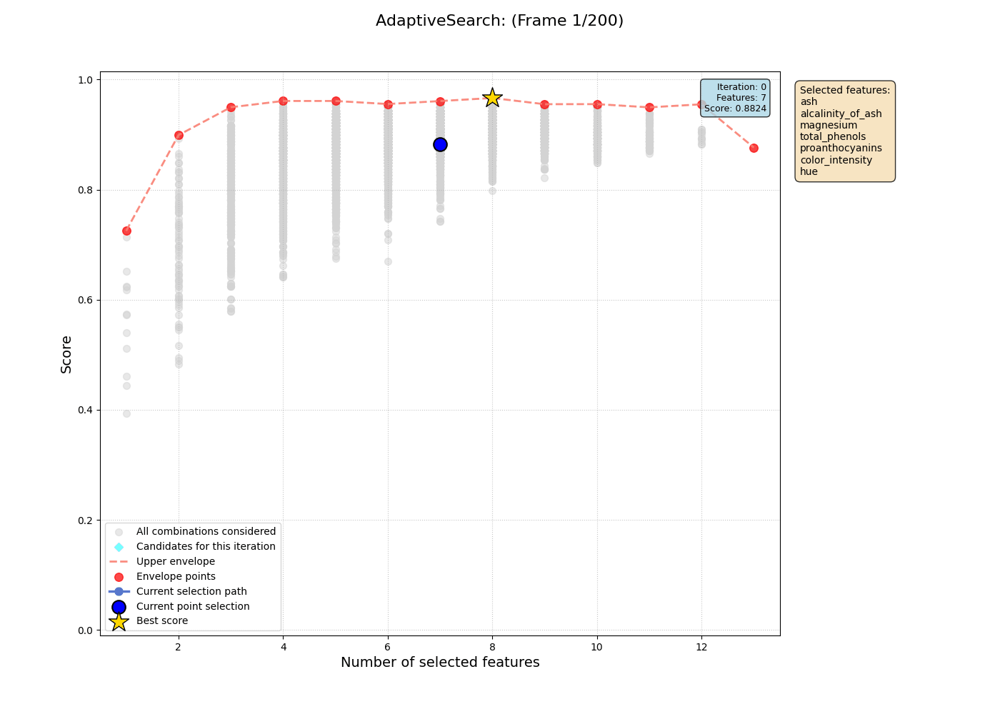

In [9]:
Image('assets/AdaptiveSearch.gif')

In [10]:
visualization_of_probs_evolution(
    adaptive_search.history,
    feature_names,
    full_search.selected_features,
    'assets/AdaptiveSearch_hist.gif',
    gif=True
)

Saving animation to assets/AdaptiveSearch_hist.gif using pillow...
Done.


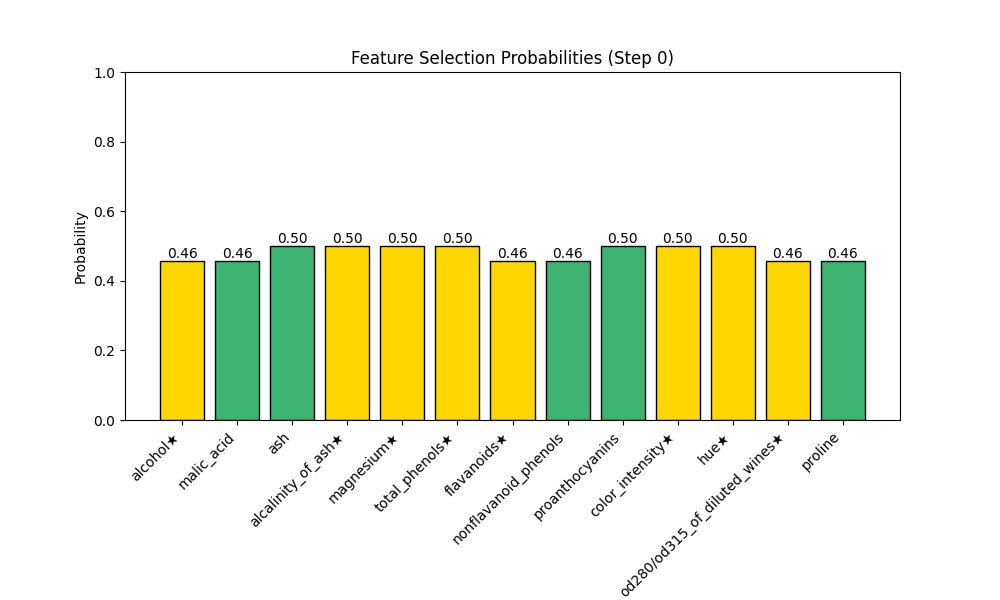

In [11]:
Image('assets/AdaptiveSearch_hist.gif')

## ForwardSearch

In [12]:
forward_search = ForwardFeatureSelector(
    cv=cv,
    estimator=estimator,
    scoring='accuracy',
)
forward_search.fit(X, y)

In [13]:
forward_search.selected_features

FeatureSet(features={0, 9, 4, 6}, score=np.float64(0.9609523809523809), original_feature_num=13)

In [14]:
animate_feature_selection_progress(
    forward_search.history,
    feature_names,
    X.shape[1],
    "ForwardSearch",
    *extract_all_points_from_history(full_search.history),
    auto_calculate_envelope=True,
    save_path='assets/ForwardSearch.gif',
    gif=True
)

Saving animation to:assets/ForwardSearch.gif...
Animation saved successfully.


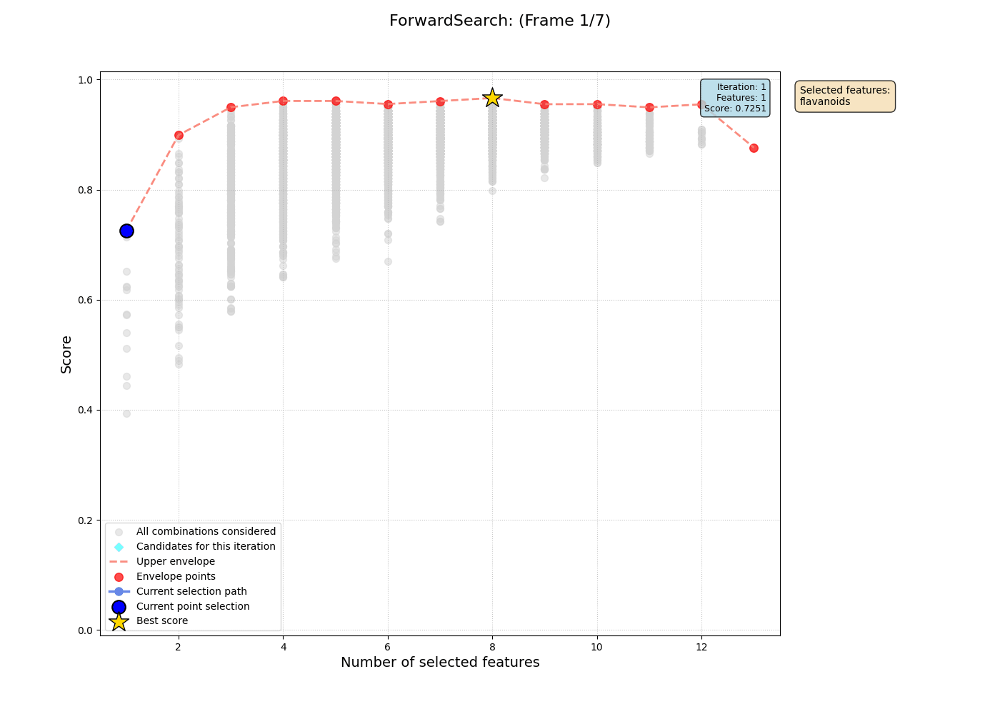

In [15]:
Image('assets/ForwardSearch.gif')

## BackwardSearch

In [16]:
backward_search = BackwardFeatureSelector(
    cv=cv,
    estimator=estimator,
    scoring='accuracy',
    max_iterations_without_improvement=10
)
backward_search.fit(X, y)

In [17]:
backward_search.selected_features

FeatureSet(features={0, 3, 4, 5, 6, 7, 8, 9}, score=np.float64(0.9606349206349206), original_feature_num=13)

In [18]:
animate_feature_selection_progress(
    backward_search.history,
    feature_names,
    X.shape[1],
    "BackwardSearch",
    *extract_all_points_from_history(full_search.history),
    auto_calculate_envelope=True,
    save_path='assets/BackwardSearch.gif',
    gif=True
)

Saving animation to:assets/BackwardSearch.gif...
Animation saved successfully.


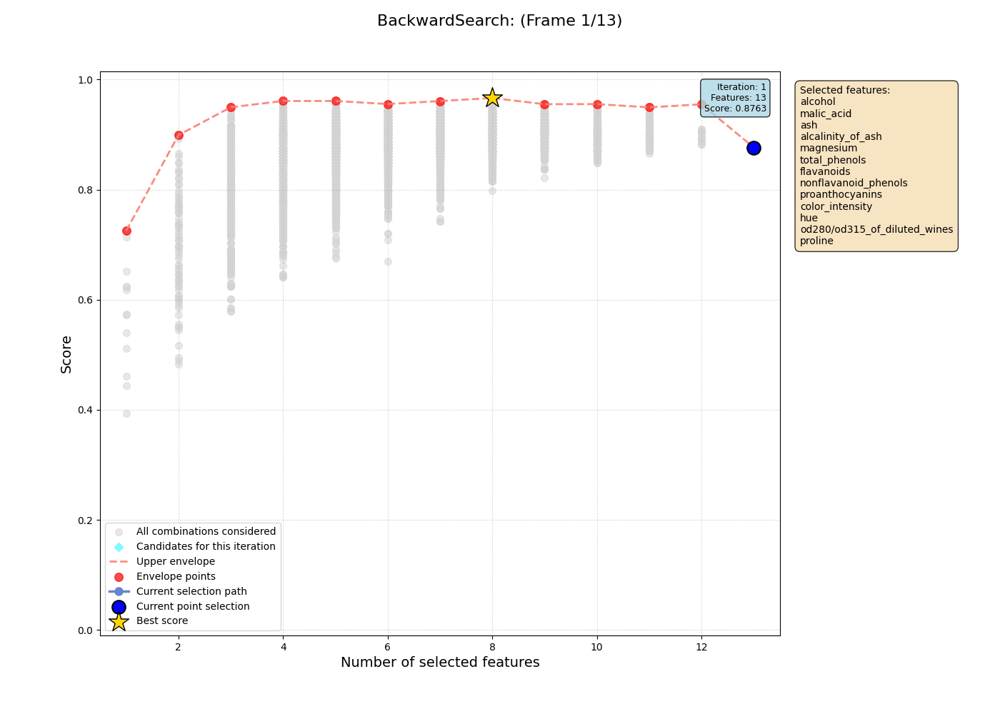

In [19]:
Image('assets/BackwardSearch.gif')


## ForwardBackwardSearch

In [20]:
forward_backward_search = ForwardBackwardFeatureSelector(
    cv=cv,
    estimator=estimator,
    scoring='accuracy',
    max_iterations_without_improvement=10
)
forward_backward_search.fit(X, y)

In [21]:
forward_backward_search.selected_features

FeatureSet(features={0, 9, 4, 6}, score=np.float64(0.9609523809523809), original_feature_num=13)

In [22]:
animate_feature_selection_progress(
    forward_backward_search.history,
    feature_names,
    X.shape[1],
    "ForwardBackwardSearch",
    *extract_all_points_from_history(full_search.history),
    auto_calculate_envelope=True,
    save_path='assets/ForwardBackwardSearch.gif',
    gif=True
)

Saving animation to:assets/ForwardBackwardSearch.gif...
Animation saved successfully.


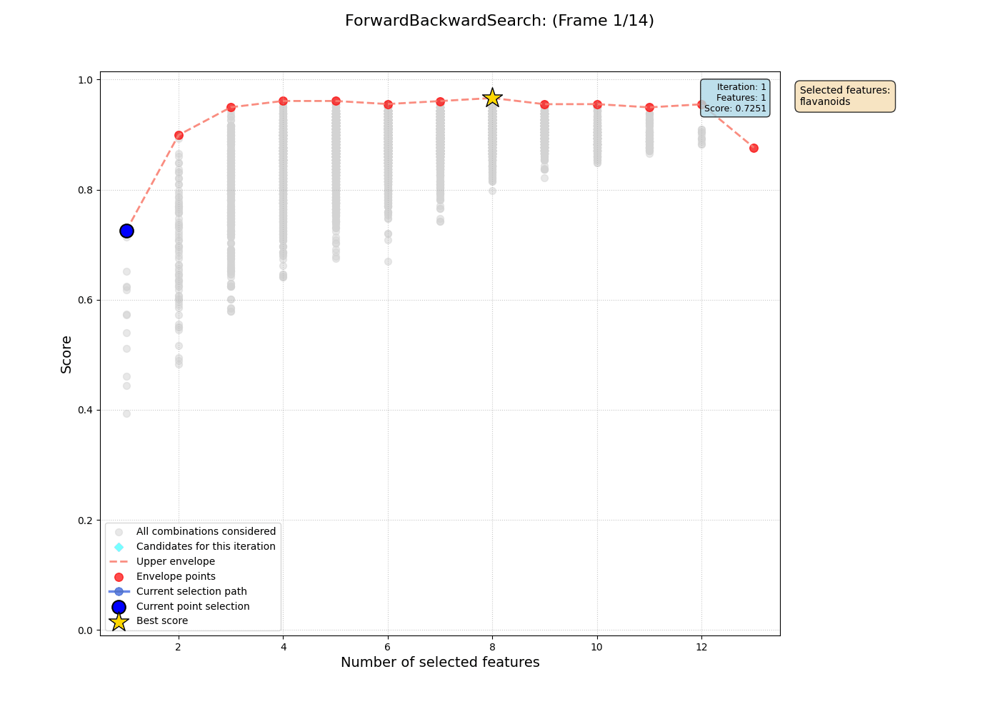

In [23]:
Image('assets/ForwardBackwardSearch.gif')


## DFSSearch

In [24]:
dfs_search = DFSFeatureSelector(
    cv=cv,
    estimator=estimator,
    scoring='accuracy',
    max_depth=10,
    max_steps=200
)
dfs_search.fit(X, y)

In [25]:
dfs_search.selected_features

FeatureSet(features=frozenset({9, 10, 11, 12}), score=np.float64(0.9269841269841269), original_feature_num=13)

In [26]:
animate_feature_selection_progress(
    dfs_search.history,
    feature_names,
    X.shape[1],
    "DFSSearch",
    *extract_all_points_from_history(full_search.history),
    auto_calculate_envelope=True,
    save_path='assets/DFSSearch.gif',
    gif=True
)

Saving animation to:assets/DFSSearch.gif...
Animation saved successfully.


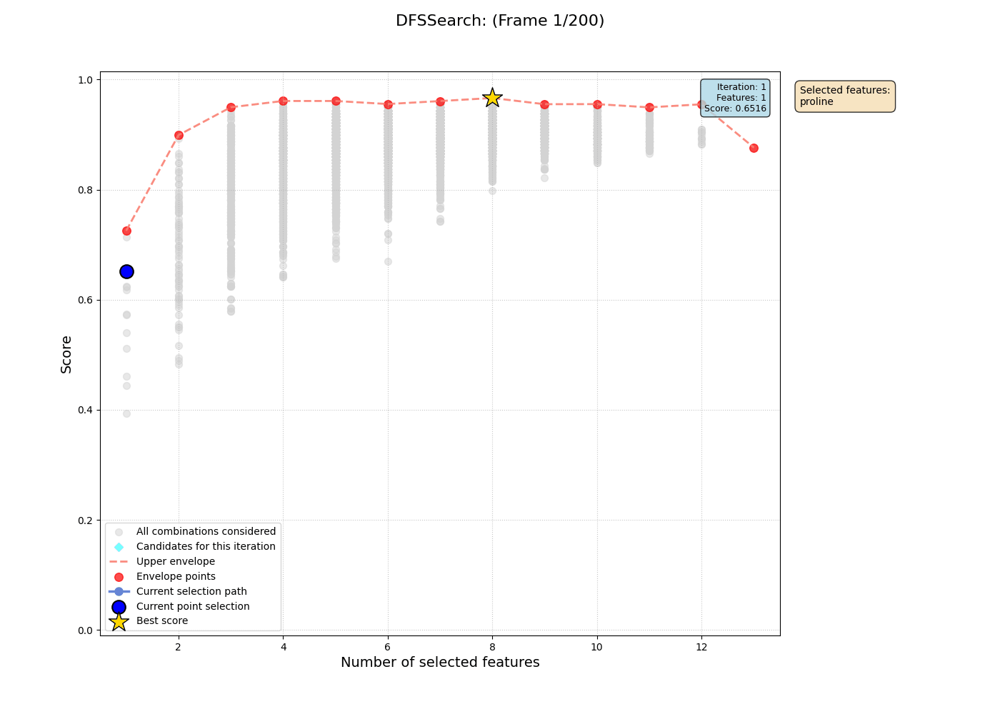

In [27]:
Image('assets/DFSSearch.gif')

## BeamSearch

In [28]:
beam_search = BeamSearchFeatureSelector(
    cv=cv,
    estimator=estimator,
    scoring='accuracy',
    beam_width=5,
    max_feature_size=X.shape[1],
)
beam_search.fit(X, y)

In [29]:
animate_feature_selection_progress(
    beam_search.history,
    feature_names,
    X.shape[1],
    "BeamSearch",
    *extract_all_points_from_history(full_search.history),
    auto_calculate_envelope=True,
    save_path='assets/BeamSearch.gif',
    gif=True
)

Saving animation to:assets/BeamSearch.gif...
Animation saved successfully.


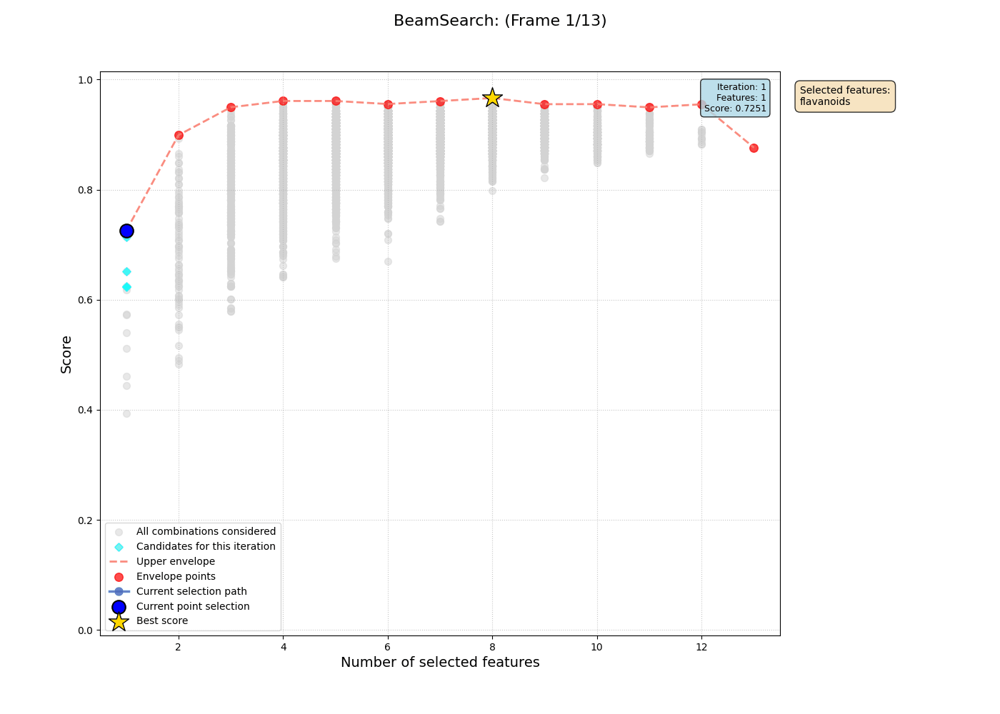

In [30]:
Image('assets/BeamSearch.gif')